<a href="https://colab.research.google.com/github/tdejaeger/Epita_lectures/blob/main/Session1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Session 1

In [4]:
from google.colab import files
img1=files.upload()

Saving zidane_couleur.png to zidane_couleur.png


In [5]:
import cv2
img = cv2.imread('zidane_couleur.png')
print(img.shape)  # (H, W, C)

(1000, 664, 3)


In [7]:
 #Load the image in gray and look at the dimension
 img_gray=cv2.imread('zidane_couleur.png', cv2.IMREAD_GRAYSCALE)
 print(img_gray.shape)  # (H, W, C)

(1000, 664)


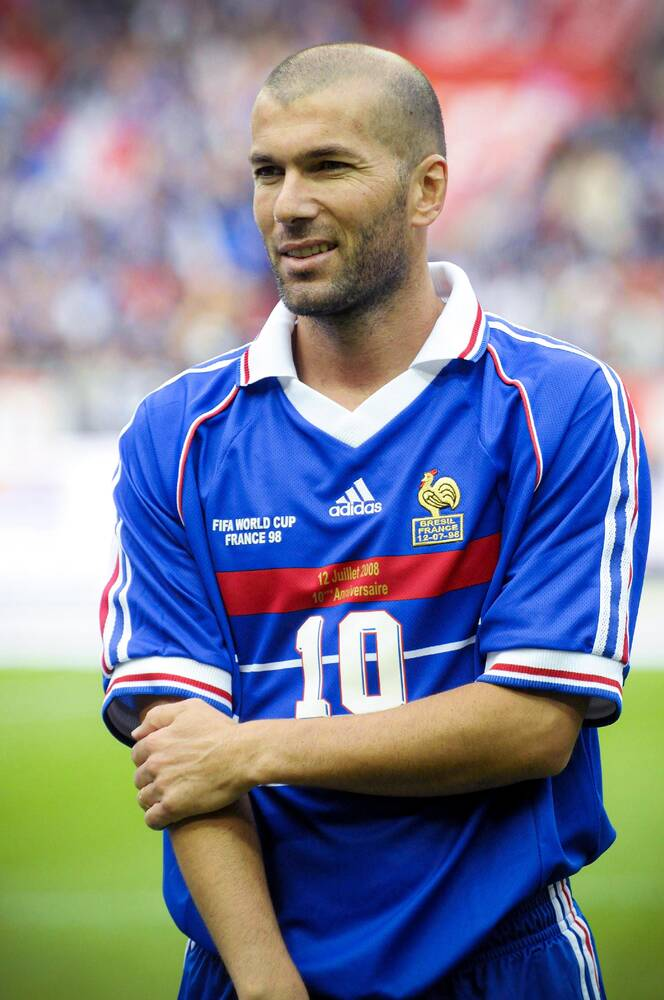

In [9]:
from google.colab.patches import cv2_imshow
cv2_imshow(img)
#cv2_imshow(img_gray)

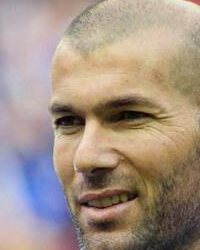

In [14]:
# Zoom
face = img[50:300, 200:400]
cv2_imshow(face)


In [12]:
# Zoom into one pixel block
zoom_1pix = img[100:101, 100:101]
print(zoom_1pix)

[[[179 157 152]]]


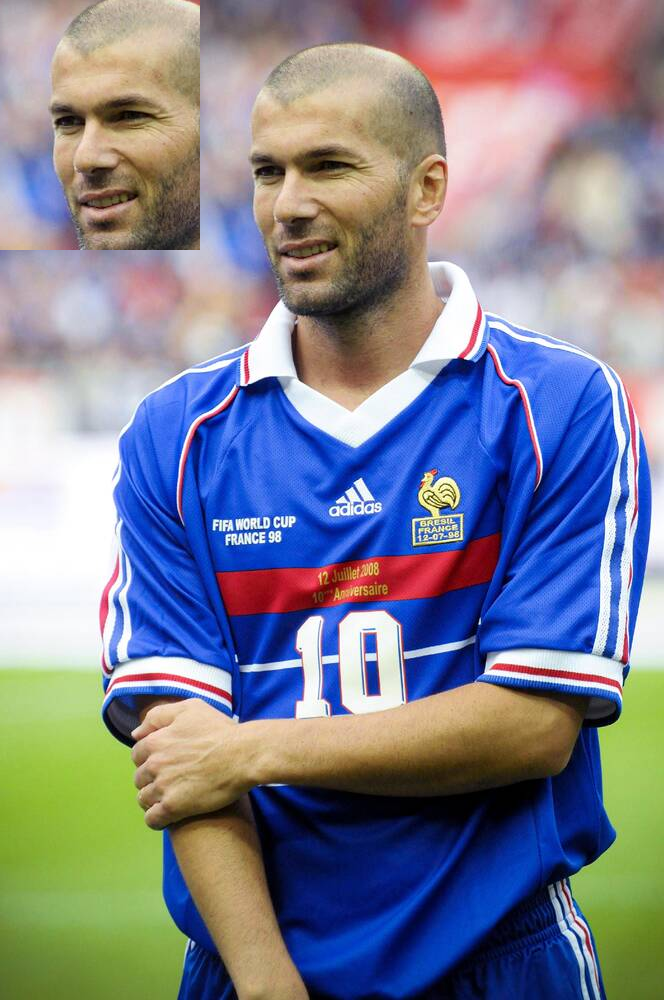

In [130]:
#Add two heads
img_2head=img.copy()
img_2head[0:250, 0:200] = face       # Paste face on top-left
cv2_imshow(img_2head)


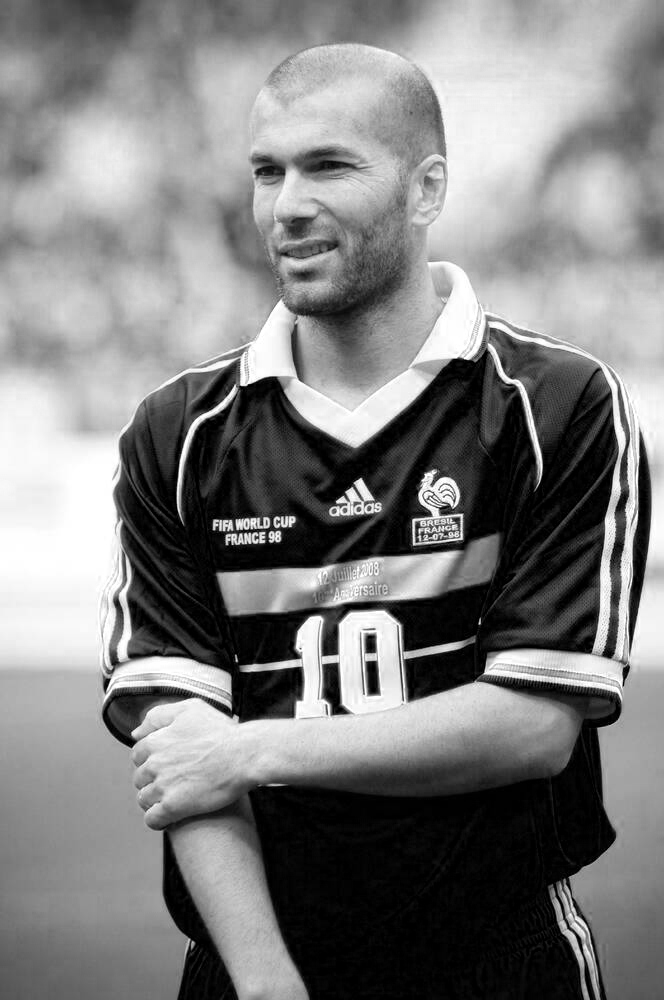

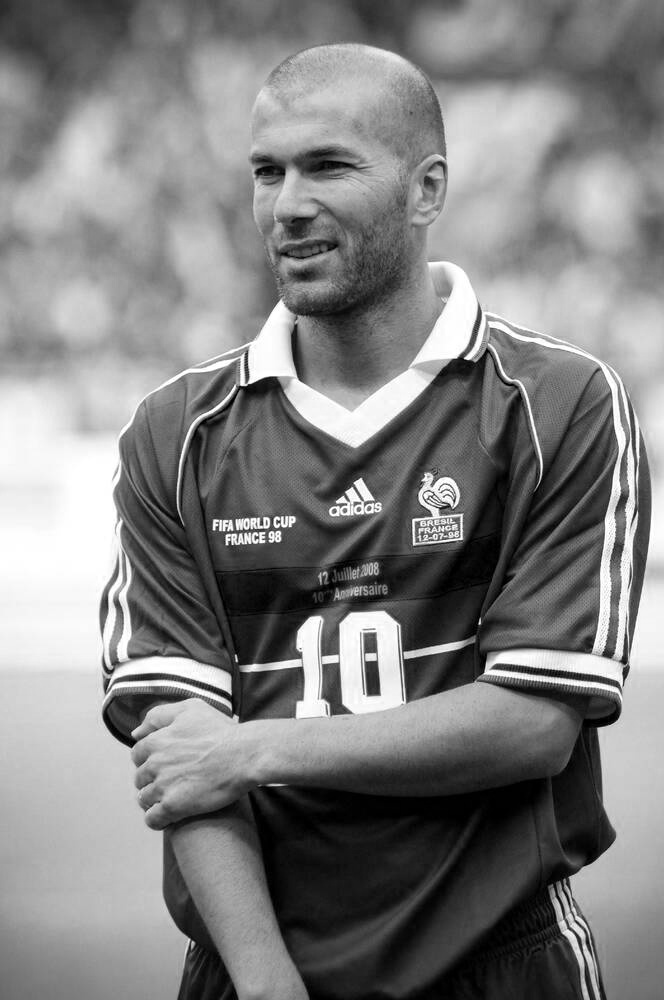

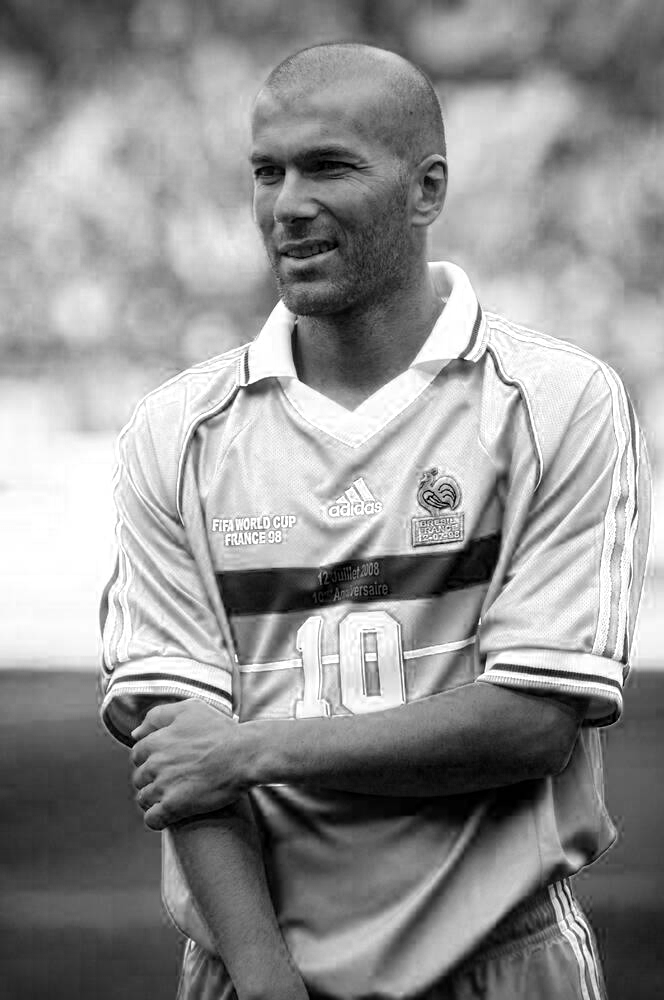

In [13]:
# Show individual channels
b, g, r = cv2.split(img)
cv2_imshow(r)
cv2_imshow(g)
cv2_imshow(b)

#Pixels close to 255 look white (high red intensity)
#Pixels close to 0 look black (low red intensity)

You can create fake images in red, green, and blue using numpy.


You set:

Red has values

Blue and green are 0

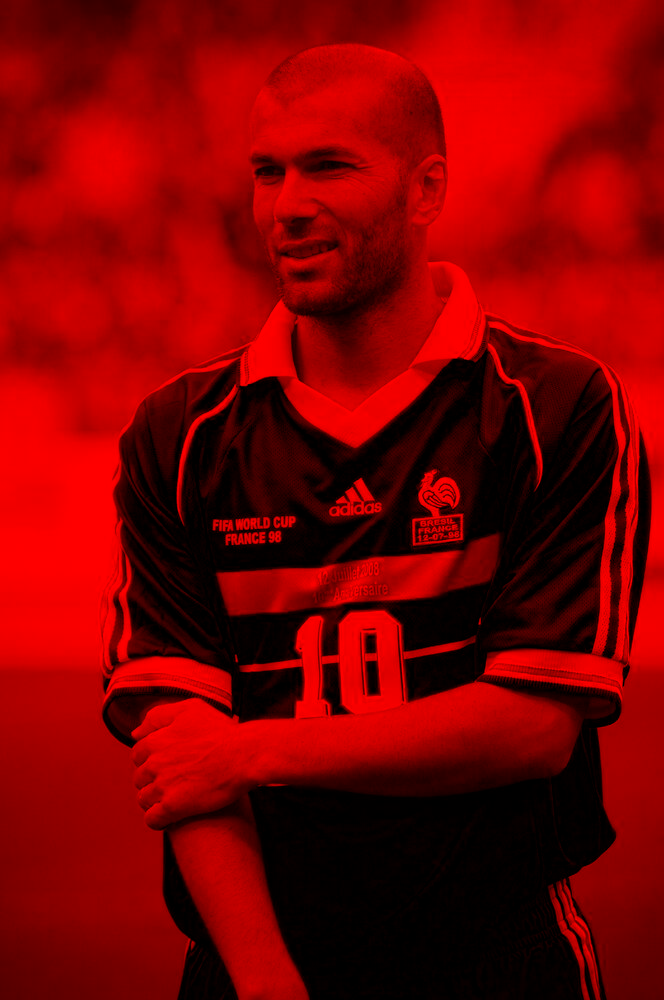

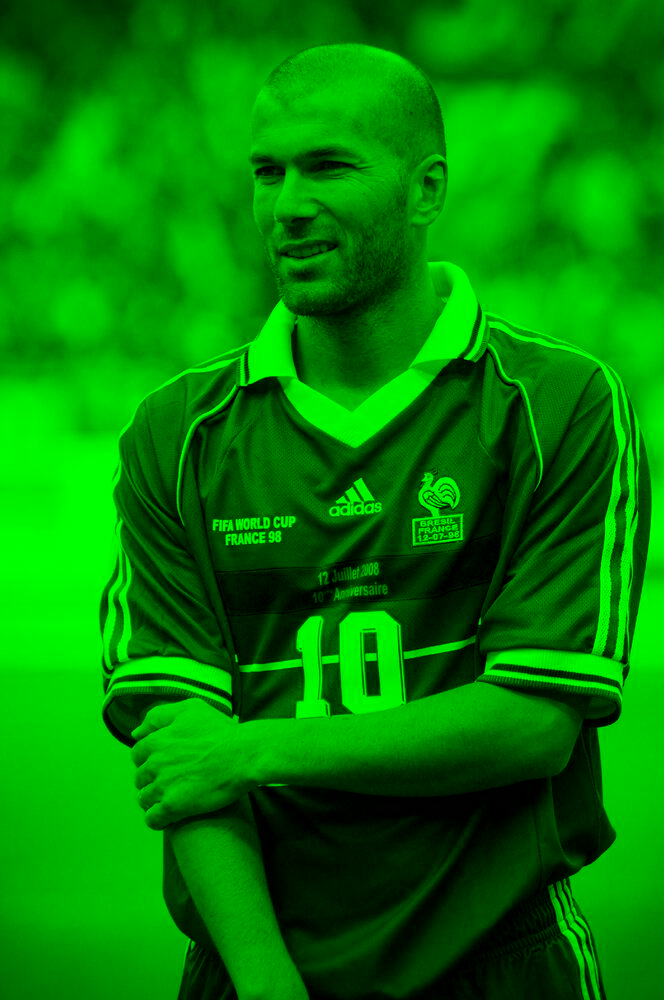

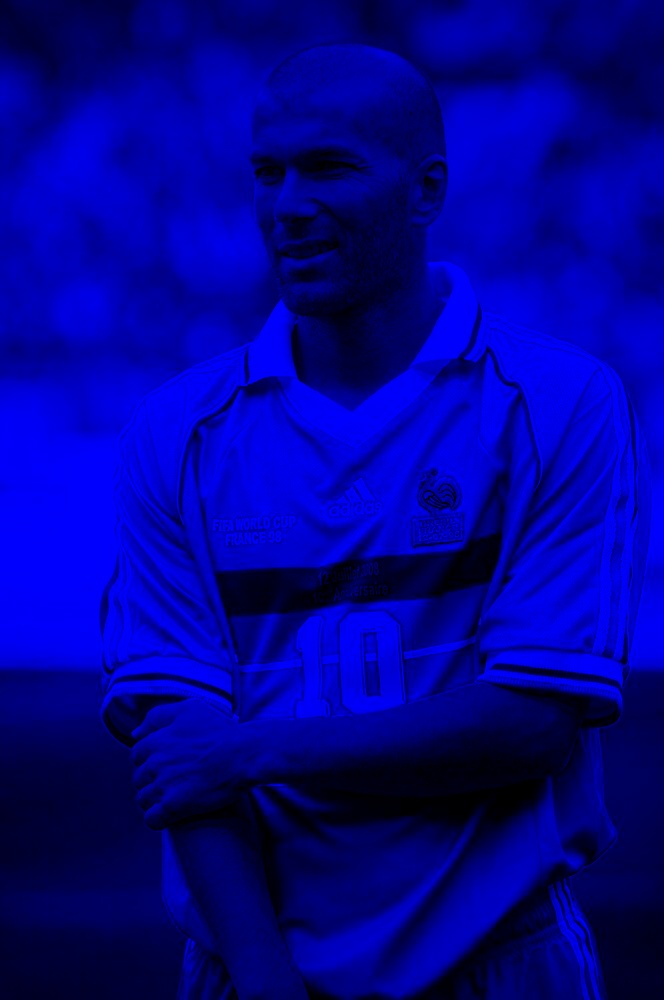

In [27]:
import numpy as np

# Red channel only, others are 0
red_img = np.zeros_like(img)
red_img[:,:,2] = r  # OpenCV uses BGR, so channel 2 = red

green_img = np.zeros_like(img)
green_img[:,:,1] = g  # Green is channel 1

blue_img = np.zeros_like(img)
blue_img[:,:,0] = b  # Blue is channel 0

cv2_imshow(red_img)
cv2_imshow(green_img)
cv2_imshow(blue_img)

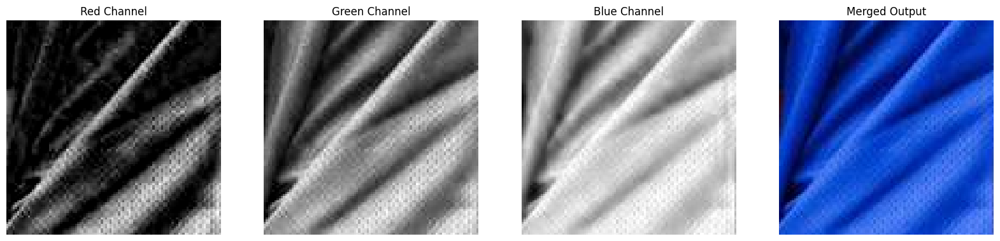

In [38]:
# To represent one colour matrix
zoom = img[500:600, 500:600]
# Split the image into the B,G,R components
b, g, r = cv2.split(zoom)

# Show the channels
plt.figure(figsize = [20, 5])

# Red Channel
plt.subplot(1, 4, 1)
plt.imshow(r, cmap = "gray")
plt.title("Red Channel")
plt.axis("off")

# Green Channel
plt.subplot(1, 4, 2)
plt.imshow(g, cmap = "gray")
plt.title("Green Channel")
plt.axis("off")

# Blue Channel
plt.subplot(1, 4, 3)
plt.imshow(b, cmap = "gray")
plt.title("Blue Channel")
plt.axis("off")

# Merge the individual channels into a BGR image
merged_img = cv2.merge((b, g, r))

# Show the merged output
plt.subplot(1, 4, 4)
plt.imshow(merged_img[:, :, ::-1])
plt.title("Merged Output")
plt.axis("off")
plt.show()


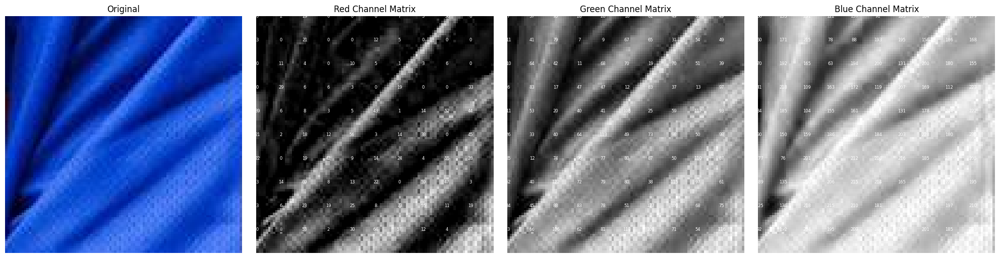

In [44]:
fig, axs = plt.subplots(1, 4, figsize=(20, 5))
#Use COLOR_BGR2RGB to tell OpenCV to convert from BGR (Blue-Green-Red) format (used by OpenCV) to RGB (Red-Green-Blue) format (used by Matplotlib)
axs[0].imshow(cv2.cvtColor(zoom, cv2.COLOR_BGR2RGB))
axs[0].set_title("Original")
axs[0].axis('off')

for ax, channel, title in zip(axs[1:], [r, g, b], ["Red", "Green", "Blue"]):
    ax.imshow(channel, cmap='gray')
    for i in range(0, channel.shape[0],10):
        for j in range(0,channel.shape[1],10):
            ax.text(j, i, str(channel[i, j]), color='white', fontsize=6, ha='center')
    ax.set_title(f"{title} Channel Matrix")
    ax.axis('off')

plt.tight_layout()
plt.show()

### **Convert the colors**

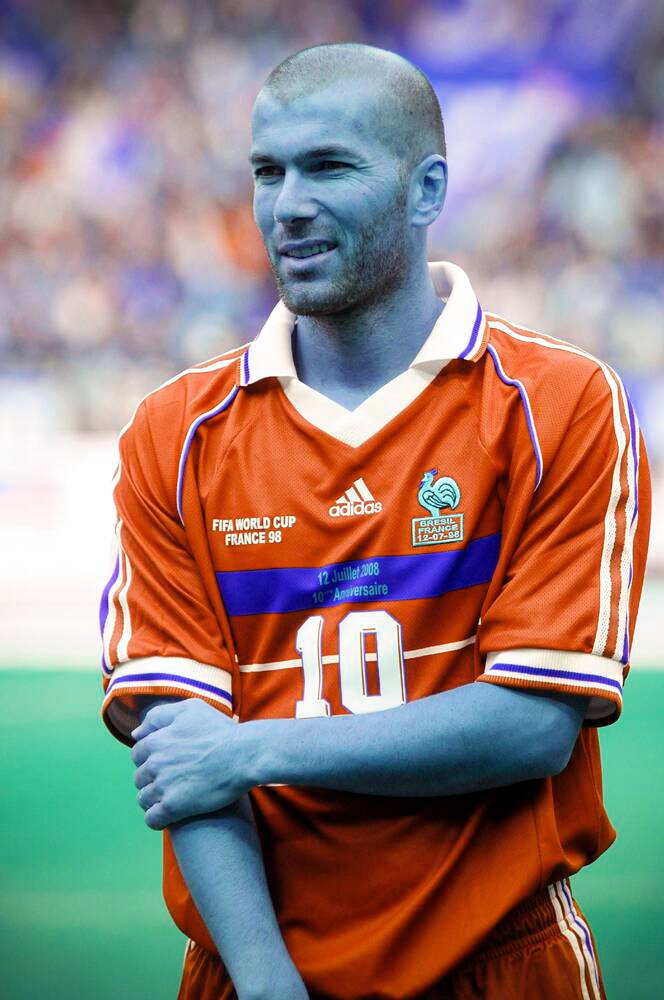

In [15]:
RGB_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
cv2_imshow(RGB_img)

# **Resize**

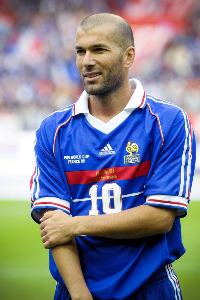

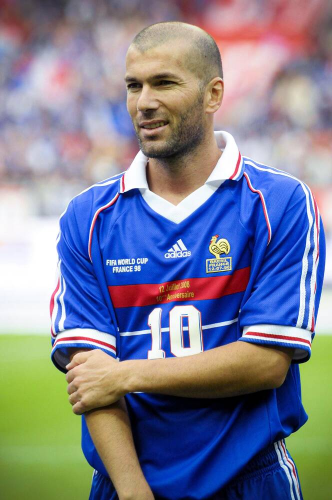

In [17]:
resized = cv2.resize(img, (200, 300))              # Resize to specific dimensions
resized2 = cv2.resize(img, None, fx=0.5, fy=0.5)     # Resize by scale

cv2_imshow(resized)
cv2_imshow(resized2)


# **Rotation**

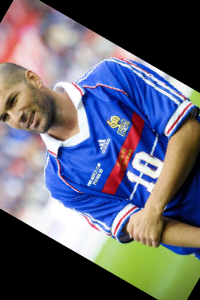

In [20]:
(h, w) = resized.shape[:2]                      # Get image height and width
center = (w // 2, h // 2)                   # Compute the center
M = cv2.getRotationMatrix2D(center, 60, 1.0)  # 45° rotation, scale=1
rotated = cv2.warpAffine(resized, M, (w, h))    # Apply the rotation
cv2_imshow(rotated)

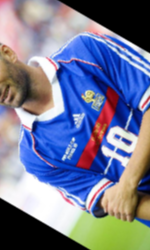

In [27]:
# Extract a part
new_w, new_h = 150, 250
final = cv2.getRectSubPix(rotated, (new_w, new_h), center)
cv2_imshow(final)

# **Flip**

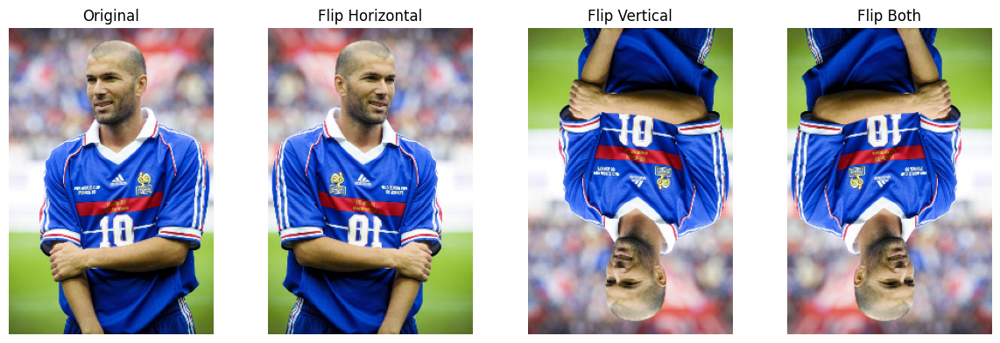

In [84]:
flip_h = cv2.flip(resized, 1)  # Horizontal
flip_v = cv2.flip(resized, 0)  # Vertical
flip_b = cv2.flip(resized, -1)  # Both

# Convert to RGB for display
resized_rgb = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)
flip_h_rgb = cv2.cvtColor(flip_h, cv2.COLOR_BGR2RGB)
flip_v_rgb = cv2.cvtColor(flip_v, cv2.COLOR_BGR2RGB)
flip_b_rgb = cv2.cvtColor(flip_b, cv2.COLOR_BGR2RGB)

# Plot images side by side
fig, axs = plt.subplots(1, 4, figsize=(12, 4))
axs[0].imshow(resized_rgb)
axs[0].set_title("Original")
axs[0].axis('off')

axs[1].imshow(flip_h_rgb)
axs[1].set_title("Flip Horizontal")
axs[1].axis('off')

axs[2].imshow(flip_v_rgb)
axs[2].set_title("Flip Vertical")
axs[2].axis('off')

axs[3].imshow(flip_b_rgb)
axs[3].set_title("Flip Both")
axs[3].axis('off')

plt.tight_layout()
plt.show()

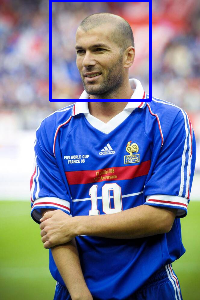

In [119]:
img = cv2.imread('zidane_couleur.png',cv2.IMREAD_COLOR)
resized = cv2.resize(img, (200, 300))              # Resize to specific dimensions

# Make a copy to draw on
img_copy = resized.copy()
cv2.rectangle(img_copy, (50, 0), (150,100), (255, 0, 0), 2)
cv2_imshow(img_copy)



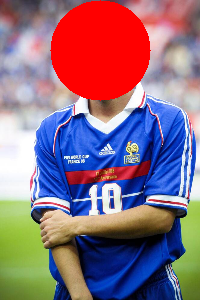

In [129]:
img = cv2.imread('zidane_couleur.png',cv2.IMREAD_COLOR)
resized = cv2.resize(img, (200, 300))              # Resize to specific dimensions

# Make a copy to draw on
img_copy = resized.copy()
cv2.circle(img_copy, (100, 50), 50, (0, 0, 255), -1)

cv2_imshow(img_copy)

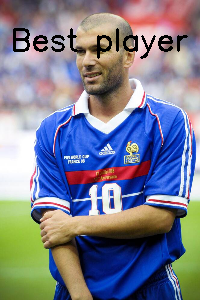

In [141]:
img = cv2.imread('zidane_couleur.png',cv2.IMREAD_COLOR)
resized = cv2.resize(img, (200, 300))              # Resize to specific dimensions

# Make a copy to draw on
img_copy = resized.copy()
cv2.putText(img_copy, "Best player ever", (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,0), 2)
cv2_imshow(img_copy)

# **HSV colors**

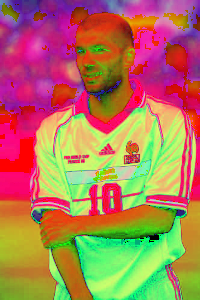

In [32]:
hsv = cv2.cvtColor(resized, cv2.COLOR_BGR2HSV)
cv2_imshow(hsv)

In [33]:
h, s, v = cv2.split(hsv)
print(h,s,v)

[[177 177 174 ... 178 177 177]
 [177 177 176 ... 177 177 177]
 [176 177 178 ... 177 177 177]
 ...
 [ 40  40  40 ...  39  39  39]
 [ 40  40  39 ...  39  39  39]
 [ 40  40  39 ...  38  39  39]] [[145 139 134 ...  49  38  38]
 [145 140 136 ...  51  38  38]
 [147 142 138 ...  51  38  39]
 ...
 [156 159 163 ... 175 179 175]
 [152 153 157 ... 175 170 170]
 [154 156 160 ... 180 175 175]] [[100 101 103 ... 140 135 136]
 [100 100 101 ... 139 135 134]
 [ 99  99  98 ... 139 135 131]
 ...
 [106 109 108 ... 109 111 109]
 [106 108 109 ... 108 108 108]
 [104 106 107 ... 106 105 105]]


# **Histogram**

In [34]:
img2=files.upload()

Saving Lena.png to Lena.png


<ipython-input-45-40a8702fecb2>:21: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  axs[1].hist(lena_gray.flatten(), 256, [0,256], color='r', alpha=0.6)


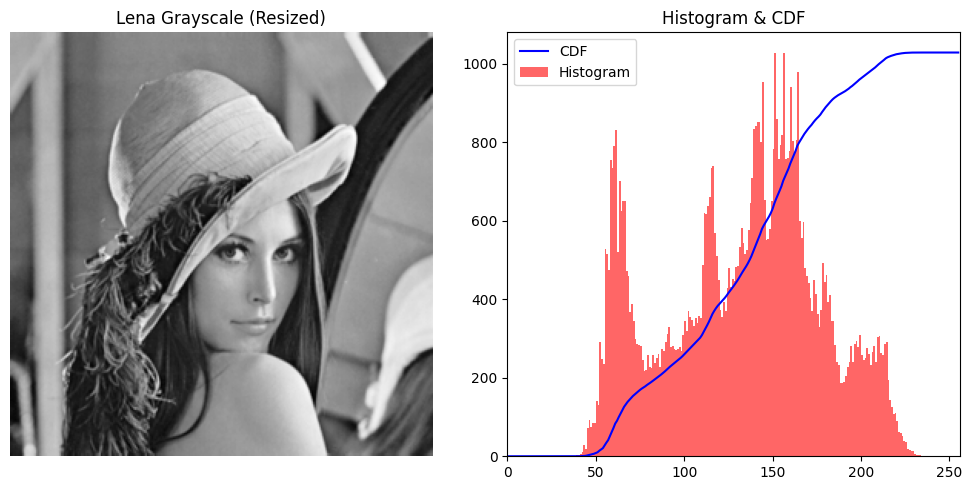

In [45]:
import numpy as np
import matplotlib.pyplot as plt

lena_gray = cv2.imread('Lena.png', cv2.IMREAD_GRAYSCALE)
lena_gray = cv2.resize(lena_gray, None, fx=0.5, fy=0.5)

# Compute histogram and CDF
hist, bins = np.histogram(lena_gray.flatten(), 256, [0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()

# Create subplot: Lena + Histogram side by side
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Show Lena grayscale image
axs[0].imshow(lena_gray, cmap='gray')
axs[0].set_title('Lena Grayscale (Resized)')
axs[0].axis('off')

# Show histogram and CDF
axs[1].hist(lena_gray.flatten(), 256, [0,256], color='r', alpha=0.6)
axs[1].plot(cdf_normalized, color='b')
axs[1].set_title('Histogram & CDF')
axs[1].legend(['CDF', 'Histogram'])
axs[1].set_xlim([0,256])

plt.tight_layout()
plt.show()

<ipython-input-47-75be9865f834>:17: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  axs[1].hist(lena_equ.flatten(), 256, [0,256], color='r', alpha=0.6)


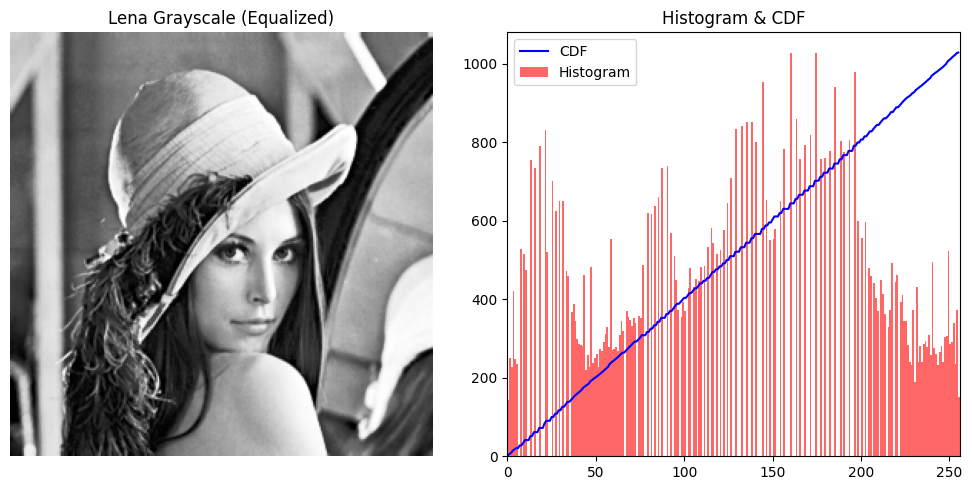

In [47]:
lena_equ = cv2.equalizeHist(lena_gray)

# Compute histogram and CDF
hist, bins = np.histogram(lena_equ.flatten(), 256, [0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()

# Create subplot: Lena + Histogram side by side
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Show Lena grayscale image
axs[0].imshow(lena_equ, cmap='gray')
axs[0].set_title('Lena Grayscale (Equalized)')
axs[0].axis('off')

# Show histogram and CDF
axs[1].hist(lena_equ.flatten(), 256, [0,256], color='r', alpha=0.6)
axs[1].plot(cdf_normalized, color='b')
axs[1].set_title('Histogram & CDF')
axs[1].legend(['CDF', 'Histogram'])
axs[1].set_xlim([0,256])

plt.tight_layout()
plt.show()

<ipython-input-54-dcfb09b12f45>:18: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  axs[1].hist(lena_clahe.flatten(), 256, [0,256], color='r', alpha=0.6)


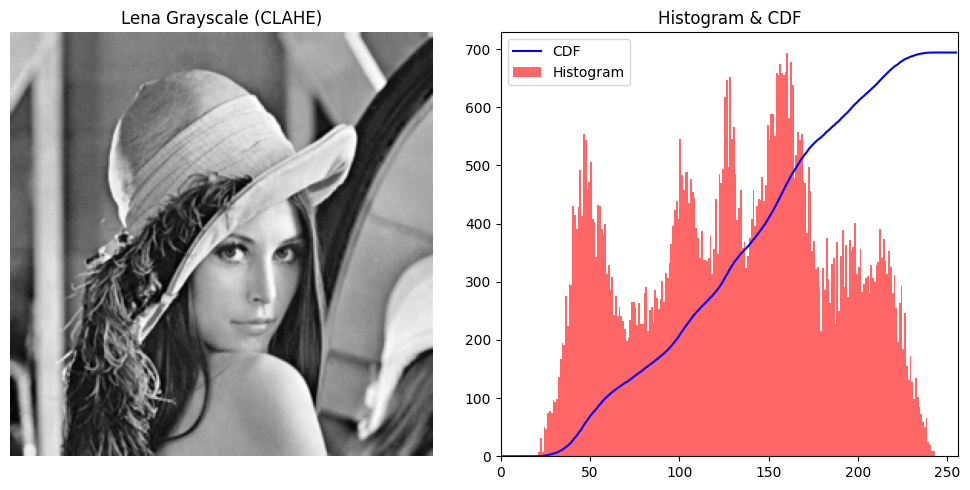

In [54]:
clahe = cv2.createCLAHE(clipLimit=1, tileGridSize=(4,4))
lena_clahe = clahe.apply(lena_gray)

# Compute histogram and CDF
hist, bins = np.histogram(lena_clahe.flatten(), 256, [0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()

# Create subplot: Lena + Histogram side by side
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Show Lena grayscale image
axs[0].imshow(lena_clahe, cmap='gray')
axs[0].set_title('Lena Grayscale (CLAHE)')
axs[0].axis('off')

# Show histogram and CDF
axs[1].hist(lena_clahe.flatten(), 256, [0,256], color='r', alpha=0.6)
axs[1].plot(cdf_normalized, color='b')
axs[1].set_title('Histogram & CDF')
axs[1].legend(['CDF', 'Histogram'])
axs[1].set_xlim([0,256])

plt.tight_layout()
plt.show()

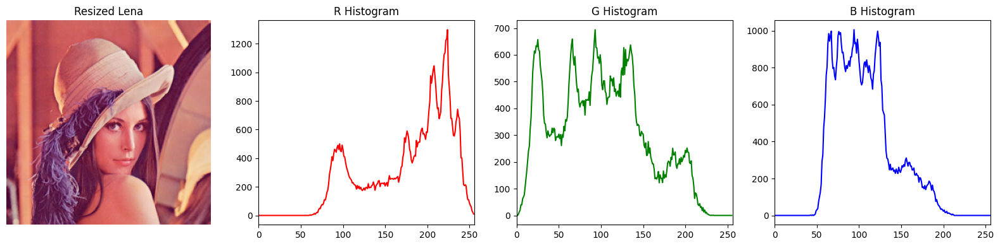

In [65]:
# Load Lena color image
lena_rgb = cv2.imread('Lena.png', cv2.IMREAD_COLOR)
# Resize to half
lena_rgb =cv2.cvtColor(lena_rgb,cv2.COLOR_BGR2RGB)
lena_rgb = cv2.resize(lena_rgb, None, fx=0.5, fy=0.5)

# Compute histograms for R, G, B channels
colors = ('r', 'g', 'b')
histograms = []
for i, col in enumerate(colors):
    hist = cv2.calcHist([lena_rgb], [i], None, [256], [0, 256])
    histograms.append((col, hist))

# Plot
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
axs[0].imshow(lena_rgb)
axs[0].set_title("Resized Lena")
axs[0].axis('off')

for i, (color, hist) in enumerate(histograms):
    axs[i+1].plot(hist, color=color)
    axs[i+1].set_xlim([0, 256])
    axs[i+1].set_title(f'{color.upper()} Histogram')

plt.tight_layout()
plt.show()

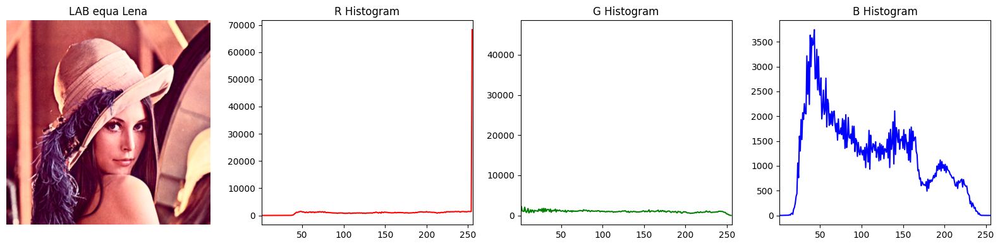

In [78]:
lena_rgb = cv2.imread('Lena.png', cv2.IMREAD_COLOR)
lena_lab = cv2.cvtColor(lena_rgb, cv2.COLOR_BGR2LAB)
l, a, b = cv2.split(lena_lab)
clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(8,8))
l_eq = clahe.apply(l)
lena_eq = cv2.cvtColor(lab_eq, cv2.COLOR_LAB2RGB)

# Compute histograms for R, G, B channels
colors = ('r', 'g', 'b')
histograms = []
for i, col in enumerate(colors):
    hist = cv2.calcHist([lena_eq], [i], None, [256], [0, 256])
    histograms.append((col, hist))

# Plot
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
axs[0].imshow(lena_eq)
axs[0].set_title("LAB equa Lena")
axs[0].axis('off')

for i, (color, hist) in enumerate(histograms):
    axs[i+1].plot(hist, color=color)
    axs[i+1].set_xlim([1, 256])
    axs[i+1].set_title(f'{color.upper()} Histogram')

plt.tight_layout()
plt.show()

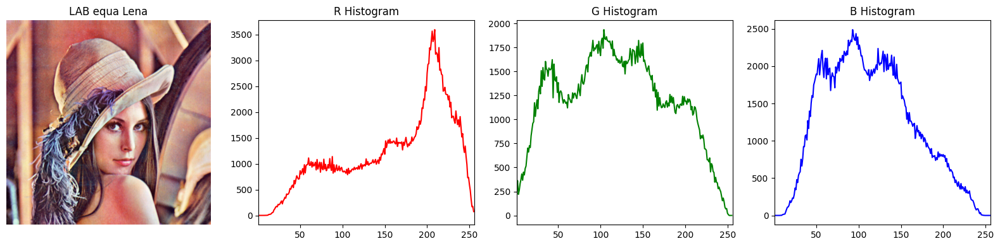

In [83]:
lena_rgb = cv2.imread('Lena.png', cv2.IMREAD_COLOR)
r, g, b = cv2.split(lena_rgb)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))

r_eq = clahe.apply(r)
g_eq = clahe.apply(g)
b_eq = clahe.apply(b)

lena_eq_rgb = cv2.merge((r_eq, g_eq, b_eq))
lena_eq_rgb = cv2.cvtColor(lena_eq_rgb, cv2.COLOR_BGR2RGB)

# Compute histograms for R, G, B channels
colors = ('r', 'g', 'b')
histograms = []
for i, col in enumerate(colors):
    hist = cv2.calcHist([lena_eq_rgb], [i], None, [256], [0, 256])
    histograms.append((col, hist))

# Plot
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
axs[0].imshow(lena_eq_rgb)
axs[0].set_title("LAB equa Lena")
axs[0].axis('off')

for i, (color, hist) in enumerate(histograms):
    axs[i+1].plot(hist, color=color)
    axs[i+1].set_xlim([1, 256])
    axs[i+1].set_title(f'{color.upper()} Histogram')

plt.tight_layout()
plt.show()